In [5]:
from genetic_algorithm import GeneticAlgorithm, Individual
from storage_fitness import Simulator

In [6]:
# ── Параметры симуляции ────────────────────────────────────────────────────────
M                     = 20    # количество строк сетки
N                     = 20    # количество столбцов сетки
ENTRIES               = 40    # количество входных ячеек
EXITS                 = 40    # количество выходных ячеек
SAVES                 = 40    # количество ячеек хранения
NUM_ROBOTS            = 40    # количество роботов
CONTAINERS_TO_PROCESS = 200   # контейнеров для обработки (критерий завершения)
PROB                  = 0.25  # вероятность появления контейнера / команды на выход за такт

# ── Гиперпараметры ГА ──────────────────────────────────────────────────────────
ga = GeneticAlgorithm(
    m=M, n=N,
    entries=ENTRIES, exits=EXITS, saves=SAVES,
    num_robots=NUM_ROBOTS,
    containers_to_process=CONTAINERS_TO_PROCESS,
    prob=PROB,
    pop_size=40,
    generations=5,
    k_tournament=10,
    elitism_count=5,
    pm=0.2,
    K_swaps=3,
    rng_seed=42,
    simulator_class=Simulator,
)

Оценка начальной популяции...
Поколение 0: best = 163, avg = 179.55
Поколение 1: best = 158, avg = 170.75, best_overall = 158
Поколение 2: best = 158, avg = 169.72, best_overall = 158
Поколение 3: best = 154, avg = 167.12, best_overall = 154
Поколение 4: best = 154, avg = 164.75, best_overall = 154
Поколение 5: best = 154, avg = 163.97, best_overall = 154


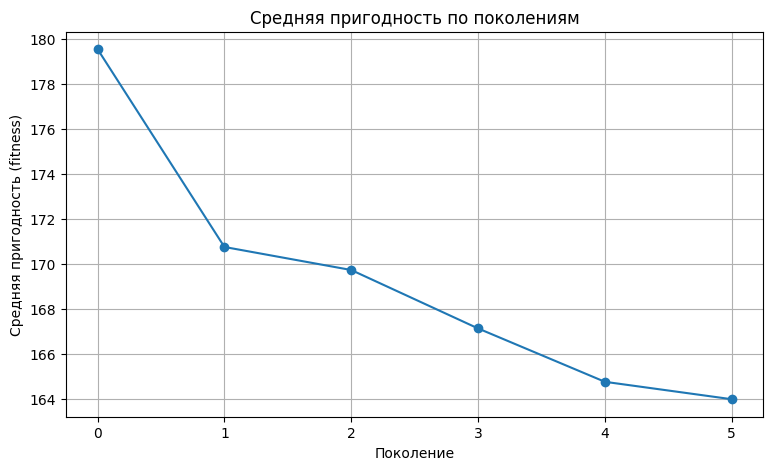

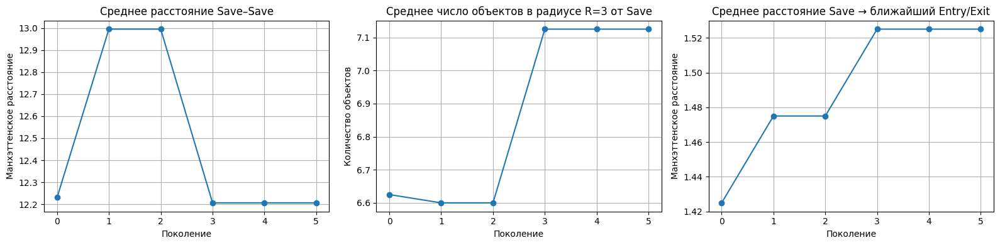


=== Лучшая найденная конфигурация ===
....X..SE...........
..XES......ES...X.XE
......S.XE..X..X....
.....S.S.......E....
.X.E.S......SX..S...
.E...XE..XX..EX.....
.ESES..EESEE.S.E...X
..SS..X...X.S...S.ES
E...EE....E.ES..E...
...SE......S.E....SE
.X..X.......S..S..S.
E.E..S.....X....EX.S
.X.XXS..S........X..
E.S.X....SX.SS..E...
XX......X....EX....E
.....S......X...E.S.
....E......E.E.X.S..
......X...XX........
.......X.EX.E.SS....
..X...X....S..S.X...
Counts: {'Road': 280, 'Entry': 40, 'Exit': 40, 'Save': 40}
Fitness: 154
Entries: [(0, 8), (1, 3), (1, 11), (1, 19), (2, 9), (3, 15), (4, 3), (5, 1), (5, 6), (5, 13), (6, 1), (6, 3), (6, 7), (6, 8), (6, 10), (6, 11), (6, 15), (7, 18), (8, 0), (8, 4), (8, 5), (8, 10), (8, 12), (8, 16), (9, 4), (9, 13), (9, 19), (11, 0), (11, 2), (11, 16), (13, 0), (13, 16), (14, 13), (14, 19), (15, 16), (16, 4), (16, 11), (16, 13), (18, 9), (18, 12)]
Exits: [(0, 4), (1, 2), (1, 16), (1, 18), (2, 8), (2, 12), (2, 15), (4, 1), (4, 13), (5, 5), (5, 9), (5, 

In [7]:
# ── Запуск эволюции ──
best, history = ga.run(verbose=True)

print("\n=== Лучшая найденная конфигурация ===")
print(best)
print("Counts:", best.count_types())
print("Fitness:", best.fitness)

entries_arr, exits_arr, saves_arr = best.to_position_lists()
print("Entries:", entries_arr)
print("Exits:",   exits_arr)
print("Saves:",   saves_arr)

In [8]:
# ── Анимация лучшей найденной конфигурации ────────────────────────────────────
# Запустите эту ячейку, чтобы увидеть работу склада с оптимальным размещением.
sim = Simulator(
    M, N, NUM_ROBOTS,
    len(entries_arr), len(exits_arr), len(saves_arr),
    CONTAINERS_TO_PROCESS, PROB,
    are_position_sampled=False,
    entries_arr=entries_arr, exits_arr=exits_arr, saves_arr=saves_arr,
)
sim.run_animated()
sim.out  # отобразить анимацию в виде встроенного HTML